<a href="https://colab.research.google.com/github/YCienne/SLv2/blob/main/NSLv2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!nvidia-smi

Thu Nov  7 12:21:44 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 49.6 MB/s eta 0:00:00


In [5]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.4/112.6 GB disk)


In [7]:
from ultralytics import YOLO
from IPython.display import Image

In [11]:


from roboflow import Roboflow
rf = Roboflow(api_key="9MEYUUm3KBR4JZtcrsUx")
project = rf.workspace("asl-dataset").project("asl-dataset-p9yw8")
version = project.version(4)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ASL-Dataset-4 in yolov11:: 100%|██████████| 1066/1066 [00:00<00:00, 4445.95it/s]


In [12]:
dataset.location

'/content/ASL-Dataset-4'

In [27]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=50 imgsz=640

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/ASL-Dataset-4/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train14, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sh

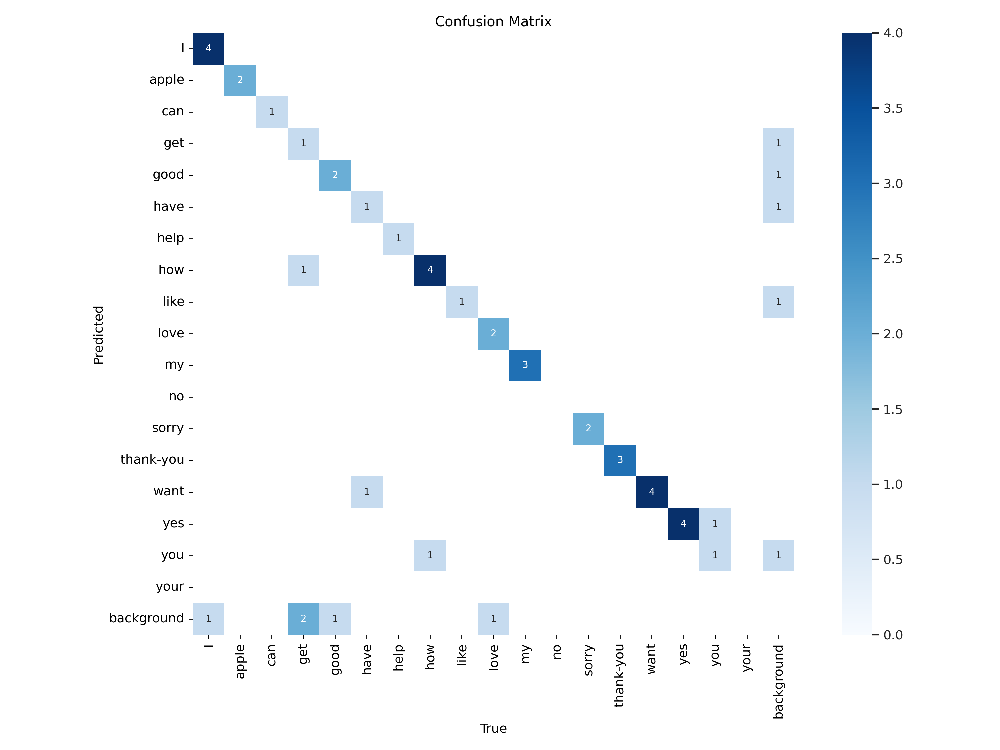

In [28]:
Image("/content/runs/detect/train14/confusion_matrix.png", width=600)

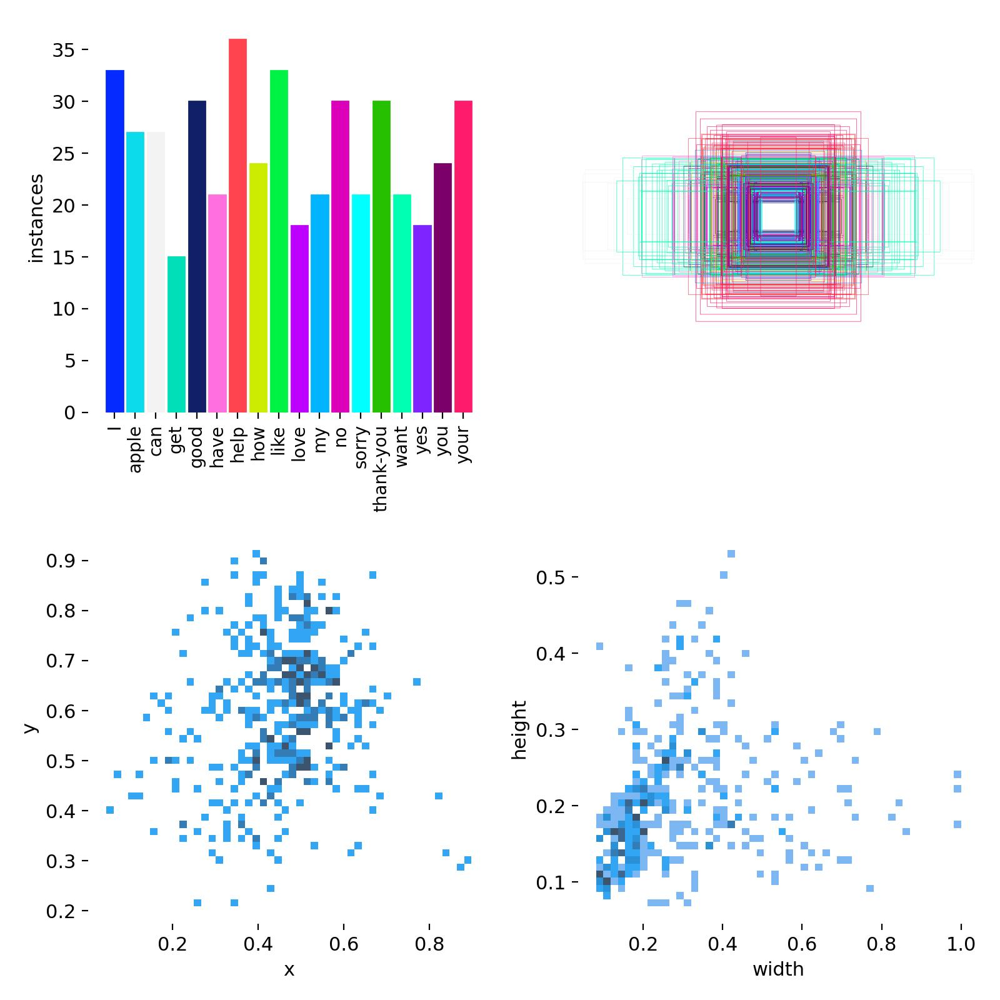

In [29]:
Image("/content/runs/detect/train14/labels.jpg", width=600)

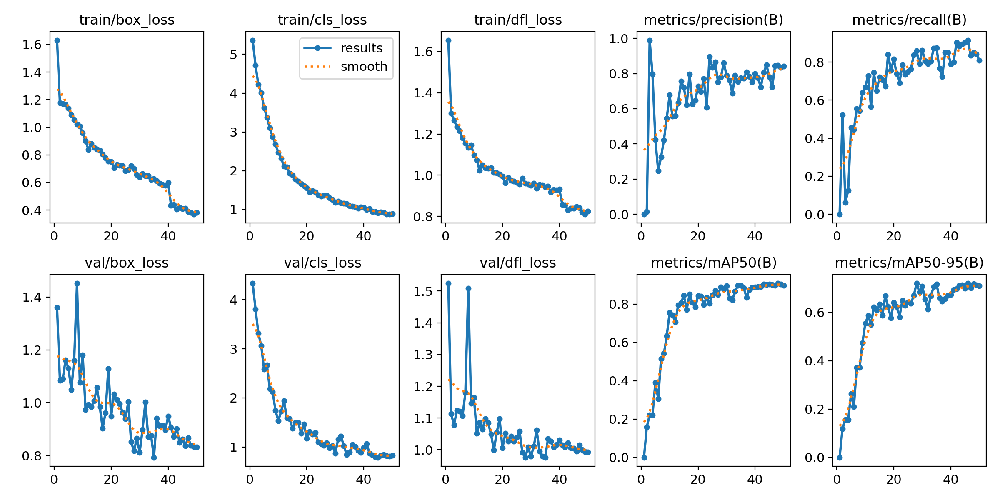

In [30]:
Image("/content/runs/detect/train14/results.png", width=600)

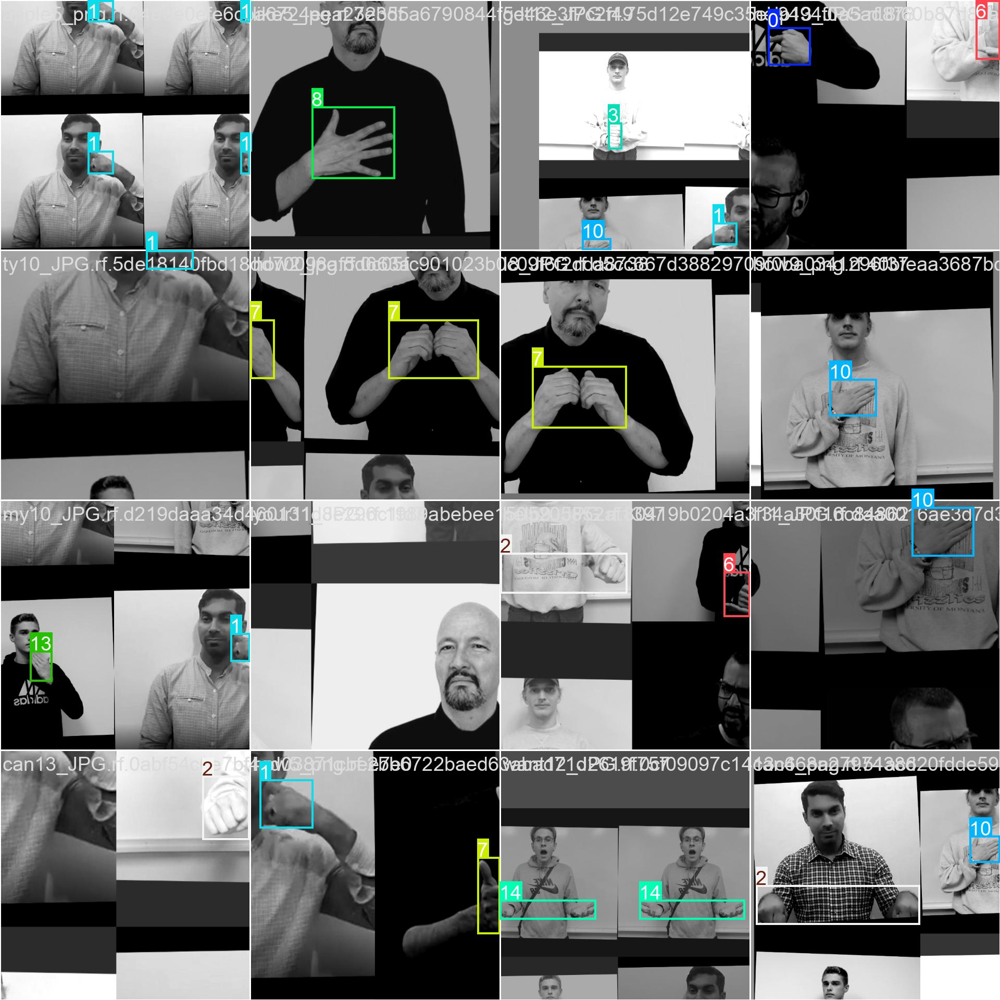

In [31]:
Image("/content/runs/detect/train14/train_batch0.jpg", width=600)

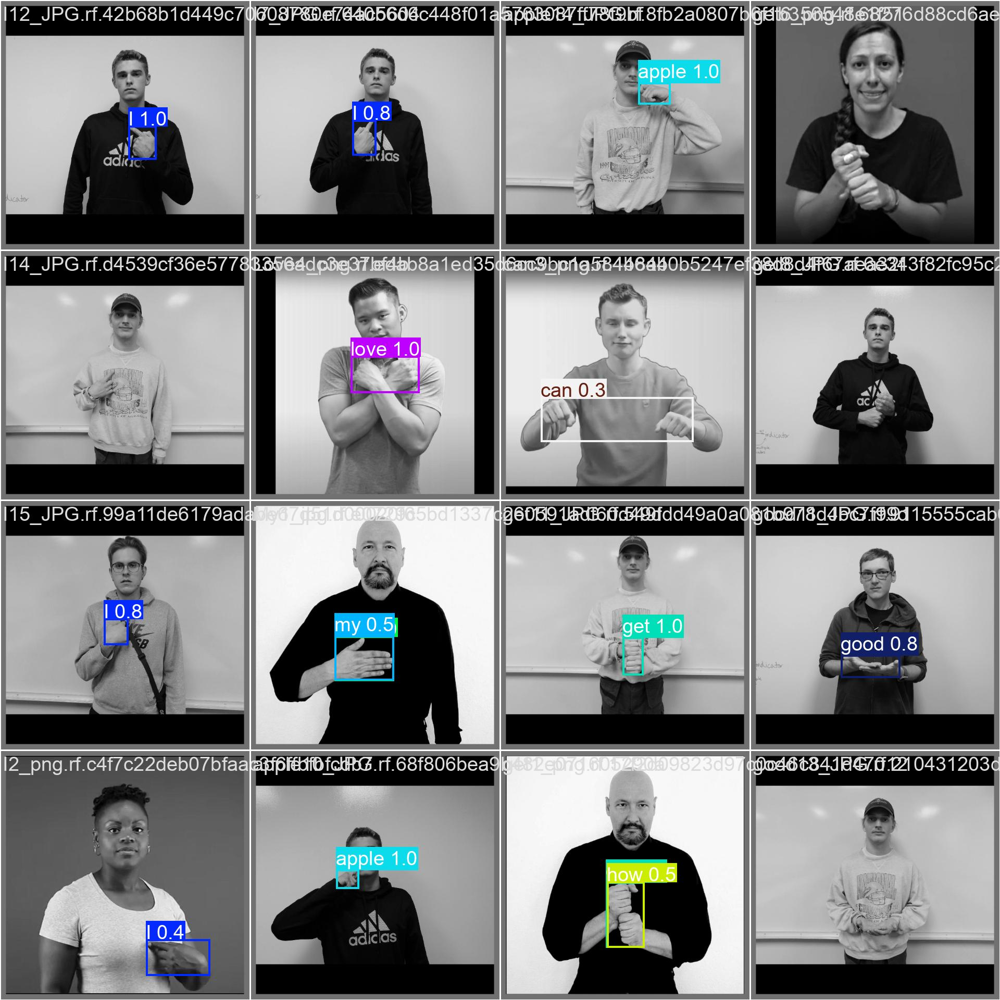

In [32]:
Image("/content/runs/detect/train14/val_batch0_pred.jpg", width=600)

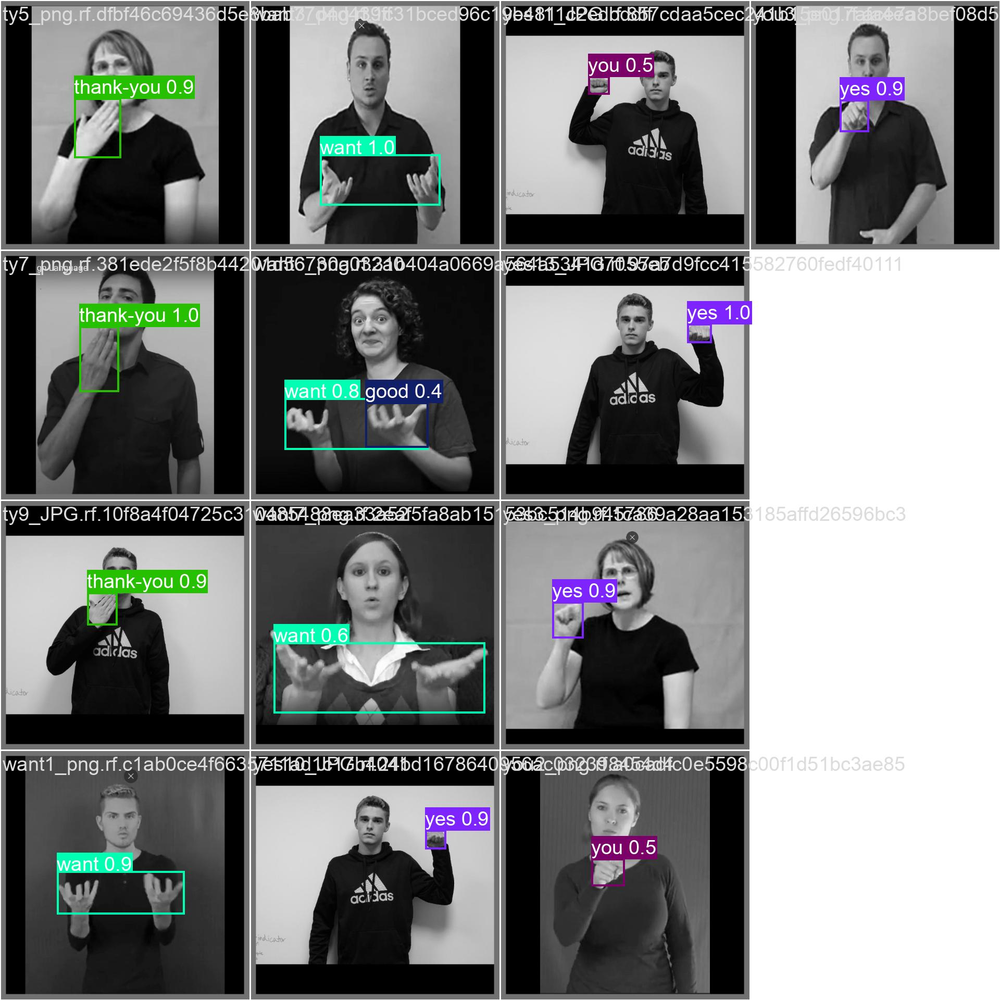

In [33]:
Image("/content/runs/detect/train14/val_batch1_pred.jpg", width=600)

In [34]:
!yolo task=detect mode=val model="/content/runs/detect/train14/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,585,662 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/ASL-Dataset-4/valid/labels.cache... 45 images, 0 backgrounds, 0 corrupt: 100% 45/45 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 3/3 [00:01<00:00,  1.53it/s]
                   all         45         45      0.725      0.915      0.902      0.721
                     I          5          5      0.873        0.8      0.962      0.678
                 apple          2          2      0.728          1      0.995      0.699
                   can          1          1      0.903          1      0.995      0.796
                   get          4          4          1      0.732      0.912      0.759
                  good          3          3      0.554      0.667      0.863      0.556
                  have          2          2      0.7

In [36]:
!yolo task=detect mode=predict model="/content/runs/detect/train14/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,585,662 parameters, 0 gradients, 6.3 GFLOPs

image 1/23 /content/ASL-Dataset-4/test/images/No1_png.rf.0f33b5bb6cc862274b2318b605836f05.jpg: 640x640 1 no, 10.0ms
image 2/23 /content/ASL-Dataset-4/test/images/apple8_png.rf.2223ad974dc1c409f6869766a3bb56cd.jpg: 640x640 1 apple, 8.5ms
image 3/23 /content/ASL-Dataset-4/test/images/can6_png.rf.a9c927fbaeddf114b68a0e840c6f37d9.jpg: 640x640 1 can, 7.9ms
image 4/23 /content/ASL-Dataset-4/test/images/get10_JPG.rf.9df5ec57a256245e5f89a121ecef58e8.jpg: 640x640 1 get, 8.4ms
image 5/23 /content/ASL-Dataset-4/test/images/get3_png.rf.eacbff80b76b970238d077e1cc42c938.jpg: 640x640 1 get, 7.9ms
image 6/23 /content/ASL-Dataset-4/test/images/good10_JPG.rf.01be30acd25b1a5650436eef4c97da1a.jpg: 640x640 1 good, 7.9ms
image 7/23 /content/ASL-Dataset-4/test/images/good8_JPG.rf.6d67a1a51c932ffa55c15a364335b075.jpg: 640x640 1 good, 7.9ms
image 

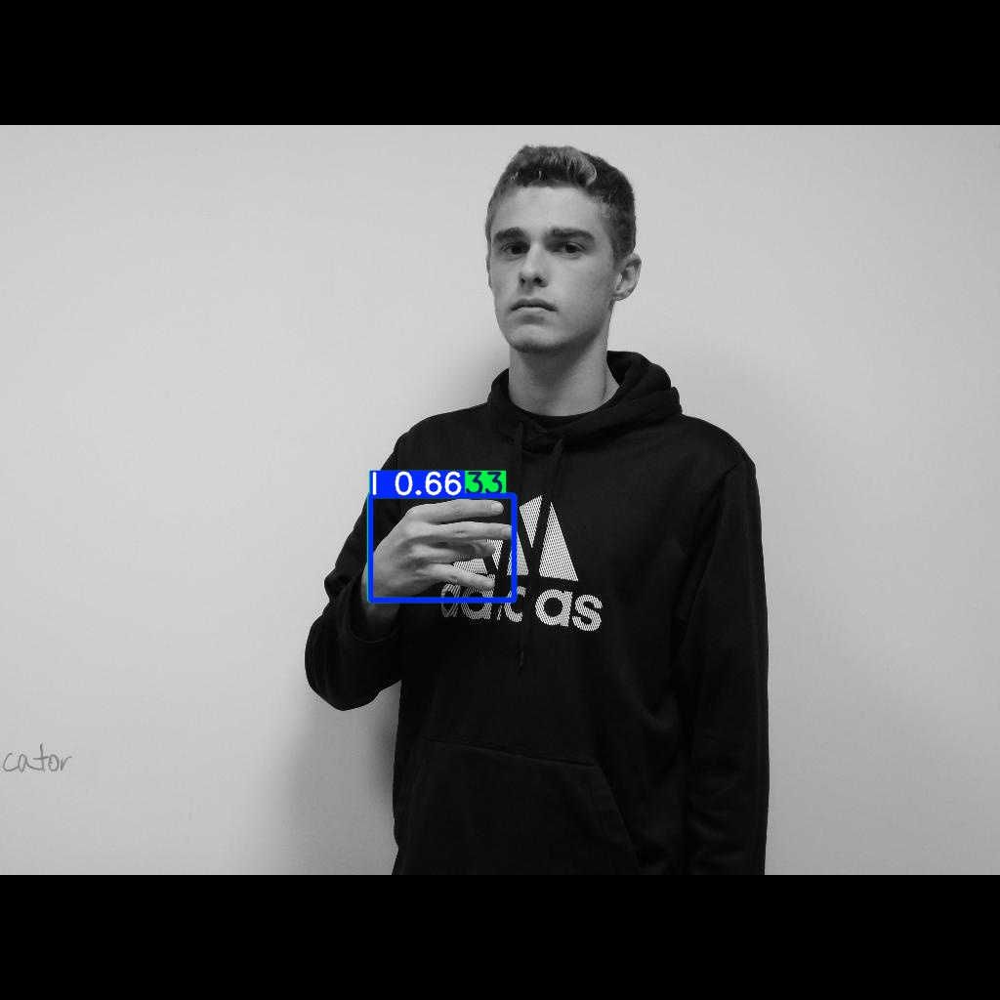

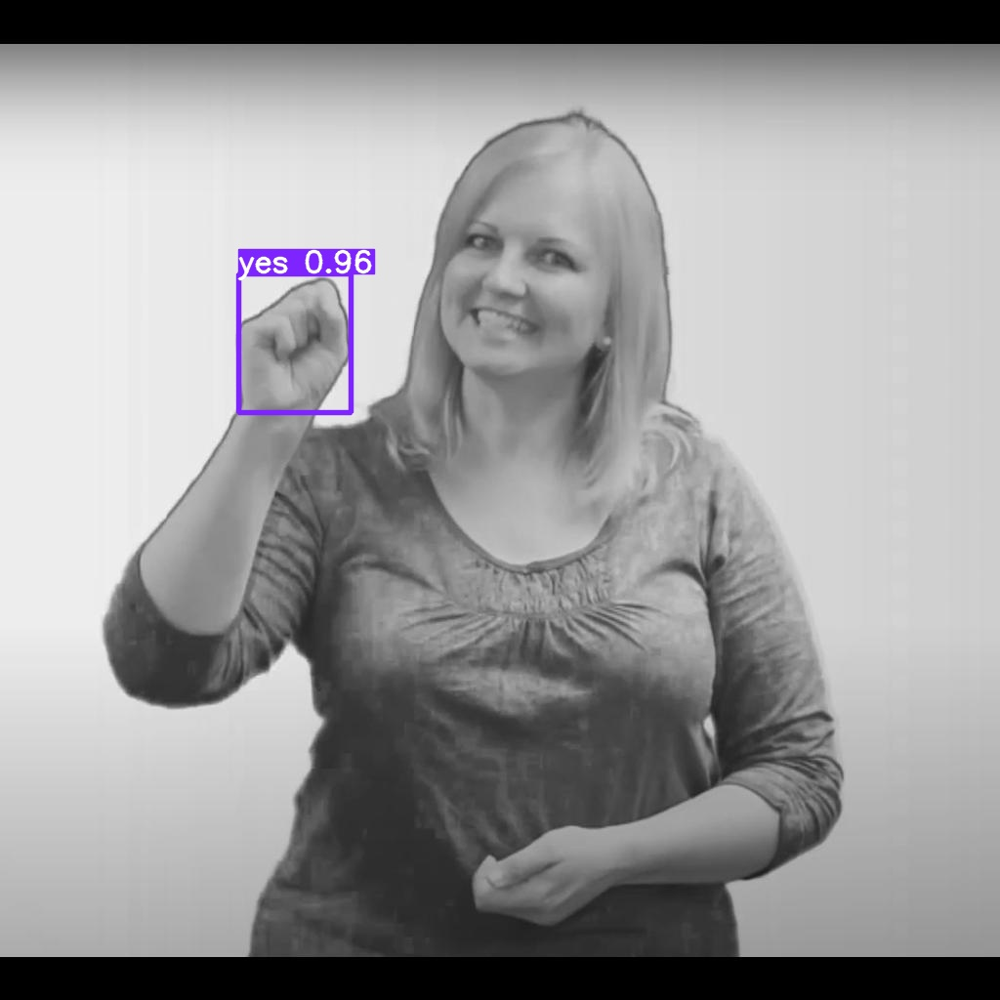

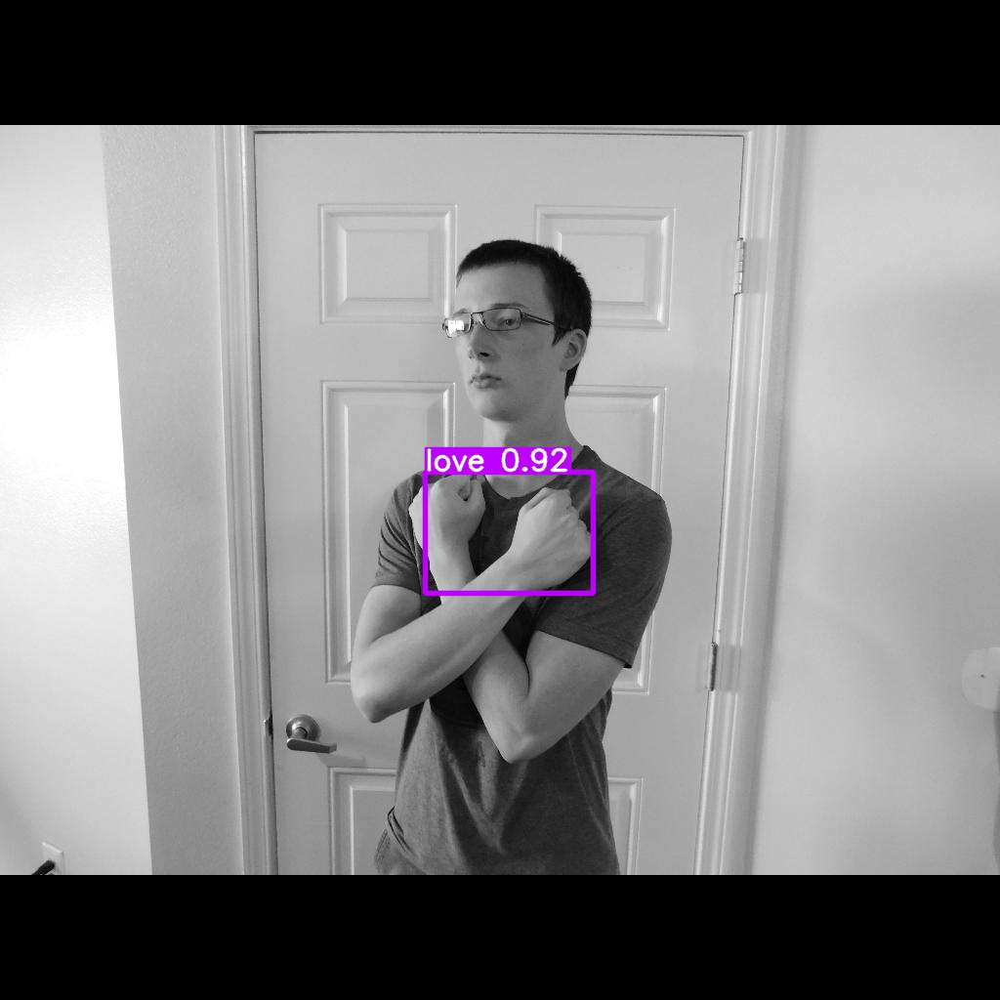

In [38]:
import glob
import os
from IPython.display import Image as IPYImage, display

test_folder = max(glob.glob('/content/runs/detect/predict2*/'), key=os.path.getmtime)
for img in glob.glob(f'{test_folder}/*.jpg')[1:4]:
  display(IPYImage(filename=img, width=600))
  print("\n")

In [43]:
!yolo task=detect mode=predict model="/content/runs/detect/train14/weights/best.pt" conf=0.25 source=app.jpg  save=True

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,585,662 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/app.jpg: 640x640 1 apple, 11.6ms
Speed: 4.4ms preprocess, 11.6ms inference, 616.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


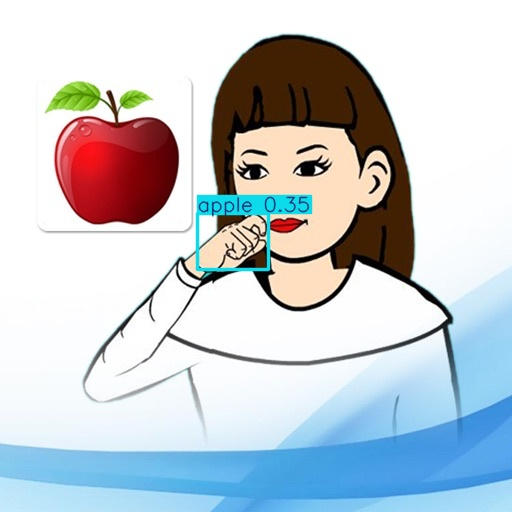

In [44]:
Image("/content/runs/detect/predict4/app.jpg", width=600)

In [45]:
!yolo task=detect mode=predict model="/content/runs/detect/train14/weights/best.pt" conf=0.25 source=testvid.mp4  save=True

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,585,662 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/1518) /content/testvid.mp4: 640x384 (no detections), 43.9ms
video 1/1 (frame 2/1518) /content/testvid.mp4: 640x384 (no detections), 9.0ms
video 1/1 (frame 3/1518) /content/testvid.mp4: 640x384 (no detections), 8.8ms
video 1/1 (frame 4/1518) /content/testvid.mp4: 640x384 (no detections), 8.1ms
video 1/1 (frame 5/1518) /content/testvid.mp4: 640x384 (no detections), 7.8ms
video 1/1 (frame 6/1518) /content/testvid.mp4: 640x384 (no detections), 8.1ms
video 1/1 (frame 7/1518) /content/testvid.mp4: 640x384 (no detections), 8.3ms
video 1/1 (frame 8/1518) /content/testvid.mp4: 640x384 (no detections), 8.7ms
video 1/1 (frame 9/1518) /content/testvid.mp4: 640x384 (no detections), 8.3ms
video 1/1 (frame 10/1518) /content/testvid.mp4: 640x384 (no detections), 7.8ms
video 1/1 (frame 11/1518) /content/testvid.mp4: 640x

In [47]:
from IPython.display import HTML
from base64 import b64encode
import os

save_vid = '/content/runs/detect/predict5/testvid.avi'

compressed_path = '/content/compressed_vid.mp4'

os.system(f"ffmpeg -i {save_vid} -vcodec libx264 {compressed_path}")

mp4 = open(compressed_path, 'rb').read()
data_url= "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
  <source src="%s" type="video/mp4">
</video>

""" % data_url)

In [48]:
pip install fastapi


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.7/94.7 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.3/73.3 kB 7.1 MB/s eta 0:00:00


In [50]:
from fastapi import FastAPI

In [54]:
from colabcode import ColabCode
cc = ColabCode(port=12000, code=False)

ModuleNotFoundError: No module named 'colabcode'

In [52]:
app = FastAPI()
@app.get("/")
async def read_root():
  return{"hello": "world"}